In [3]:
import pandas as pd
import numpy as np
pd.core.common.is_list_like = pd.api.types.is_list_like
import pandas_datareader.data as web
from datetime import datetime
import datetime as dt

import re
import string
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer

/Users/beiming/anaconda3/lib/python3.6/site-packages/nltk/twitter/__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


In [5]:
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

In [7]:
%config InlineBackend.figure_format = 'retina'
plt.style.use('fivethirtyeight')

import seaborn as sns

from wordcloud import WordCloud
from PIL import Image

In [8]:
DATA_PATH = '../data/'
IMG_PATH = '../images/'

In [9]:
!ls {DATA_PATH}

realDonaldTrump.xlsx


In [12]:
negations_dic = {"isn't":"is not", "aren't":"are not", "wasn't":"was not", "weren't":"were not",
                "haven't":"have not","hasn't":"has not","hadn't":"had not","won't":"will not",
                "wouldn't":"would not", "don't":"do not", "doesn't":"does not","didn't":"did not",
                "can't":"can not","couldn't":"could not","shouldn't":"should not","mightn't":"might not",
                "mustn't":"must not"}
neg_pattern = re.compile(r'\b(' + '|'.join(negations_dic.keys()) + r')\b')

stop_words = set(stopwords.words('english'))

def words(text):
    """
    Given a string, return a list of words normalized as follows.
    Remove url links
    Split the string to make words first by using regex compile() function
    and string.punctuation + '0-9\\r\\t\\n]' to replace all those
    char with a space character.
    Split on space to get word list.
    Ignore words < 3 char long.
    Lowercase all words
    Remove English stop words
    """
    text = re.sub(r"http\S+", "",text)
    text = re.sub(r"pic\S+", "",text)
    text = text.lower()
    text = neg_pattern.sub(lambda x: negations_dic[x.group()], text)
    regex = re.compile('[' + re.escape(string.punctuation+"“”’") + '0-9\\r\\t\\n]')
    text = regex.sub(" ",text)
    words = text.split(" ")
    words = [w for w in words if len(w) > 2 if w not in stop_words]
    
    return ' '.join(words)

In [13]:
start = datetime(2017, 1, 1)
end = datetime(2018, 5, 16)

In [38]:
tw = pd.read_excel(DATA_PATH+'realDonaldTrump.xlsx')
text = tw['text']
text.to_csv(DATA_PATH+'text.csv')

In [35]:
%%time
#tw['date'] = tw['date'].apply(lambda x: x.date())
tw = tw[tw['date'] >= start]
tw['pst_hour'] = tw['date'].apply(lambda x: x.hour)
tw['length'] = tw['text'].apply(lambda x: len(x))
tw['clean_text'] = tw['text'].apply(lambda x: words(x))

tw['text'] = tw['text'].apply(lambda x: x.replace('. ', '.<br>'))
tw['text'] = tw['text'].apply(lambda x: x.replace(', ', ',<br>'))
tw['text'] = tw['text'].apply(lambda x: x.replace('! ', '!<br>'))
tw['text'] = tw['text'].apply(lambda x: x.replace('? ', '?<br>'))
tw['text'] = tw['text'].apply(lambda x: x.replace('(', '<br>('))

CPU times: user 168 ms, sys: 2.52 ms, total: 170 ms
Wall time: 169 ms


In [15]:
sentence = tw.text[100]
print(sentence)
print()
print(words(sentence))

Delegation heading to China to begin talks on the Massive Trade Deficit that has been created with our Country.<br>Very much like North Korea,<br>this should have been fixed years ago,<br>not now.<br>Same with other countries and NAFTA...but it will all get done.<br>Great Potential for USA!

delegation heading china begin talks massive trade deficit created country much like north korea fixed years ago countries nafta get done great potential usa


In [16]:
tw.sample(5)

,text,date,favorites,retweets,hashtags,mentions,permalink,id,score,pst_hour,length,clean_text
910,"DOW,<br>S&P 500 and NASDAQ close at record hig...",2017-12-15 16:00:11,56268,12499,MAGA,NaN,https://twitter.com/realDonaldTrump/status/941...,941820213518938112,0.0000,16,79,dow nasdaq close record highs maga
32,Big week next week when the American Embassy i...,2018-05-11 16:39:01,144670,31193,NaN,NaN,https://twitter.com/realDonaldTrump/status/995...,995085901079433219,0.6360,16,106,big week next week american embassy israel mov...
830,“Trump Rally: Stocks put 2017 in the record bo...,2017-12-30 20:46:21,64270,13503,NaN,NaN,https://twitter.com/realDonaldTrump/status/947...,947328044821336070,0.0000,20,149,trump rally stocks put record books foxbusines...
459,Mainstream Media in U.S.<br>is being mocked al...,2018-03-03 09:33:53,73695,20080,NaN,NaN,https://twitter.com/realDonaldTrump/status/969...,969989251537481730,-0.6932,9,145,mainstream media mocked world gone crazy twitt...
1388,"The wonderful people of Puerto Rico,<br>with t...",2017-10-13 05:01:02,61309,11397,NaN,NaN,https://twitter.com/realDonaldTrump/status/918...,918808798059483136,0.2244,5,134,wonderful people puerto rico unmatched spirit ...


In [17]:
tw.length.quantile([0, .1, .2, .25, .5, .75, .8, .9, 1.])

0.00     10.0
0.10     86.0
0.20    119.0
0.25    130.0
0.50    140.0
0.75    183.0
0.80    210.2
0.90    273.0
1.00    393.0
Name: length, dtype: float64

In [18]:
# short and long
tw['tweet_length'] = 'short'
tw.loc[tw['length'] >= 140, 'tweet_length'] = 'long'

In [20]:
# strong relationship between retweets and favorites
np.corrcoef(tw.retweets, tw.favorites)

array([[1.        , 0.88511164],
       [0.88511164, 1.        ]])

In [14]:
# no strong relationship between retweets and sentiment scores
np.corrcoef(tw.retweets, tw.score)

array([[ 1.        , -0.13343022],
       [-0.13343022,  1.        ]])

In [15]:
tw.score.quantile([0, .1, .2, .3, .5, .7, .8, .9, 1.])

0.0   -0.97490
0.1   -0.73396
0.2   -0.47530
0.3    0.00000
0.5    0.38020
0.7    0.68000
0.8    0.79590
0.9    0.88580
1.0    0.98990
Name: score, dtype: float64

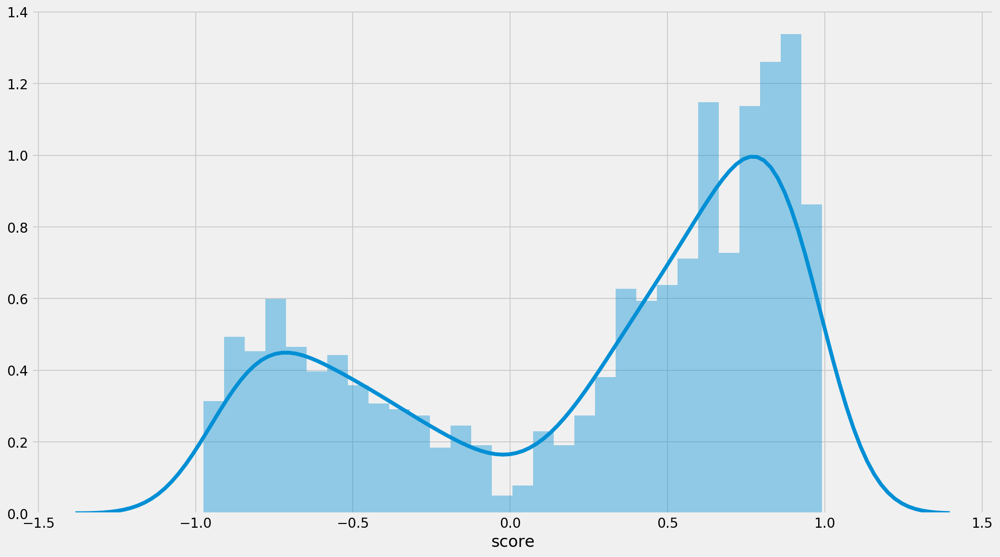

In [16]:
plt.figure(figsize=(16,9))
# the sentiment score doesn't capture some of the emotions in the tweet
# so ignore those sentiment score == 0
tmp = tw[tw.score!=0]
sns.distplot(tmp['score'], 30);

CPU times: user 23.7 s, sys: 2.67 s, total: 26.4 s
Wall time: 26.4 s


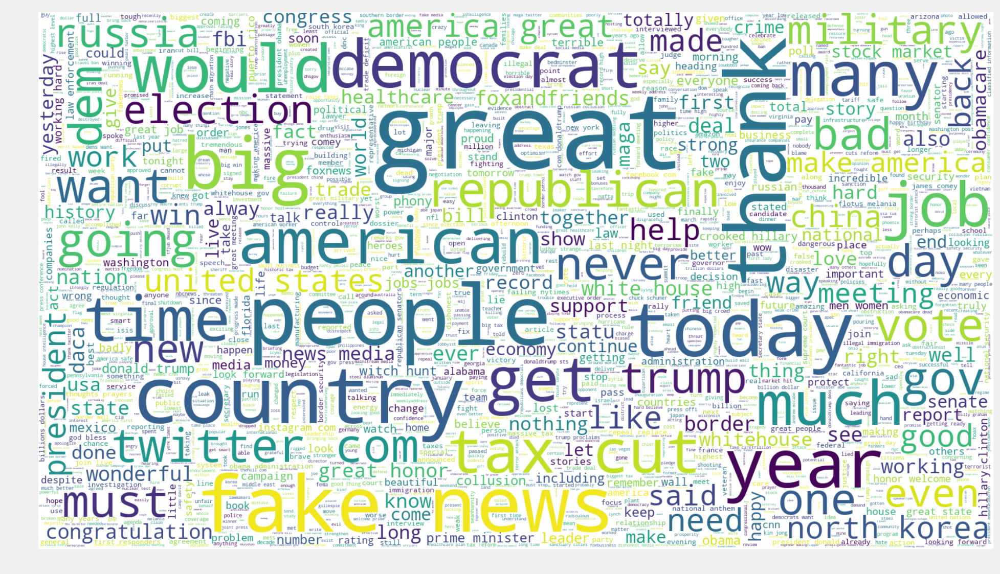

In [17]:
%%time
# all tweets
plt.figure(figsize=(16,9))
text = " ".join(tw.clean_text)
masked = np.array(Image.open(IMG_PATH+"TT2.png"))

wc = WordCloud(background_color="white", max_words=2000, mask=masked,
               stopwords=stop_words) 

wc.generate(text)

# store to file
wc.to_file(IMG_PATH+"trump_tweets_word_cloud_all.png")

# show
plt.imshow(wc, interpolation='bilinear');
plt.axis("off");

CPU times: user 26 s, sys: 3.21 s, total: 29.2 s
Wall time: 29.3 s


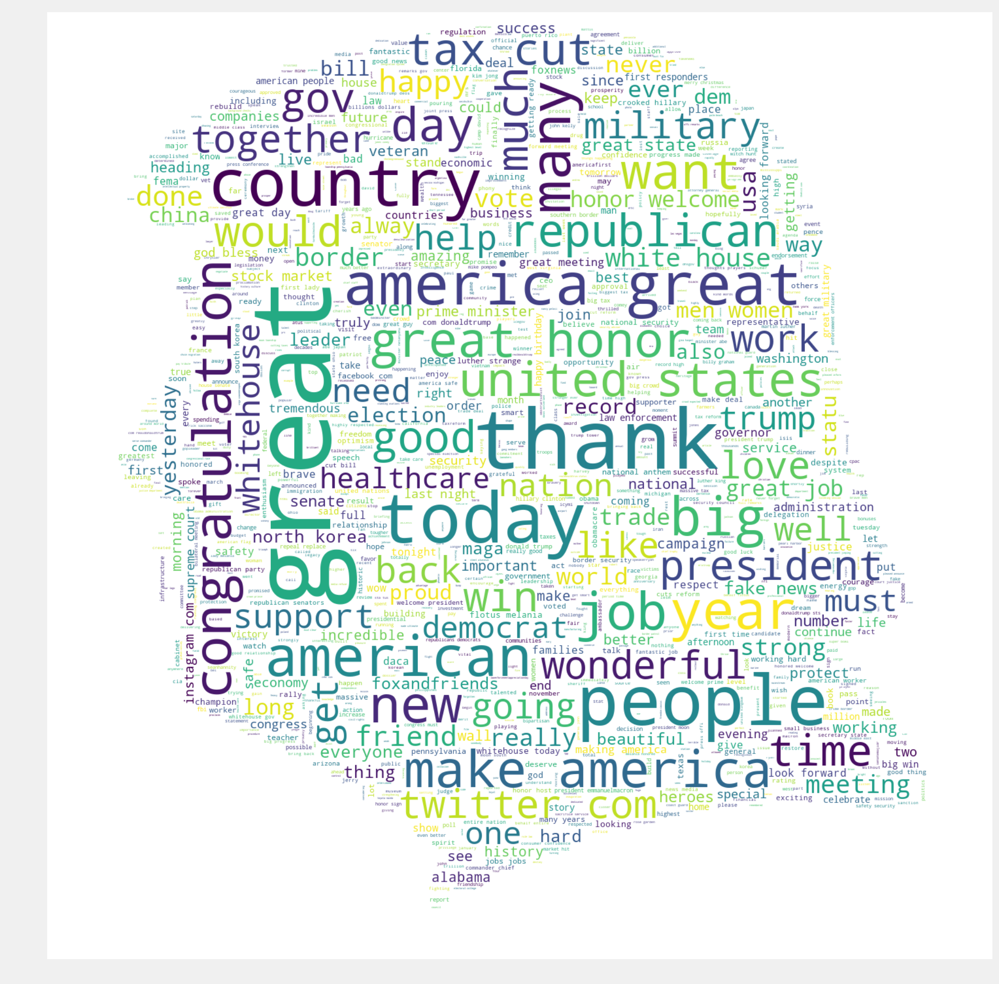

In [18]:
%%time
# positive sentiment
pos = " ".join(tw.loc[tw.score > .6 , 'clean_text'])

masked = np.array(Image.open(IMG_PATH+"TTT1.png"))


wc = WordCloud(background_color="white", max_words=2000, mask=masked,
               stopwords=stop_words)

# generate word cloud
wc.generate(pos)

# store to file
wc.to_file(IMG_PATH+"trump_tweets_wordcloud_pos.png")

# show
plt.figure(figsize=(16,16))
plt.imshow(wc, interpolation='bilinear');
plt.axis("off");

CPU times: user 26.7 s, sys: 3.39 s, total: 30.1 s
Wall time: 30.2 s


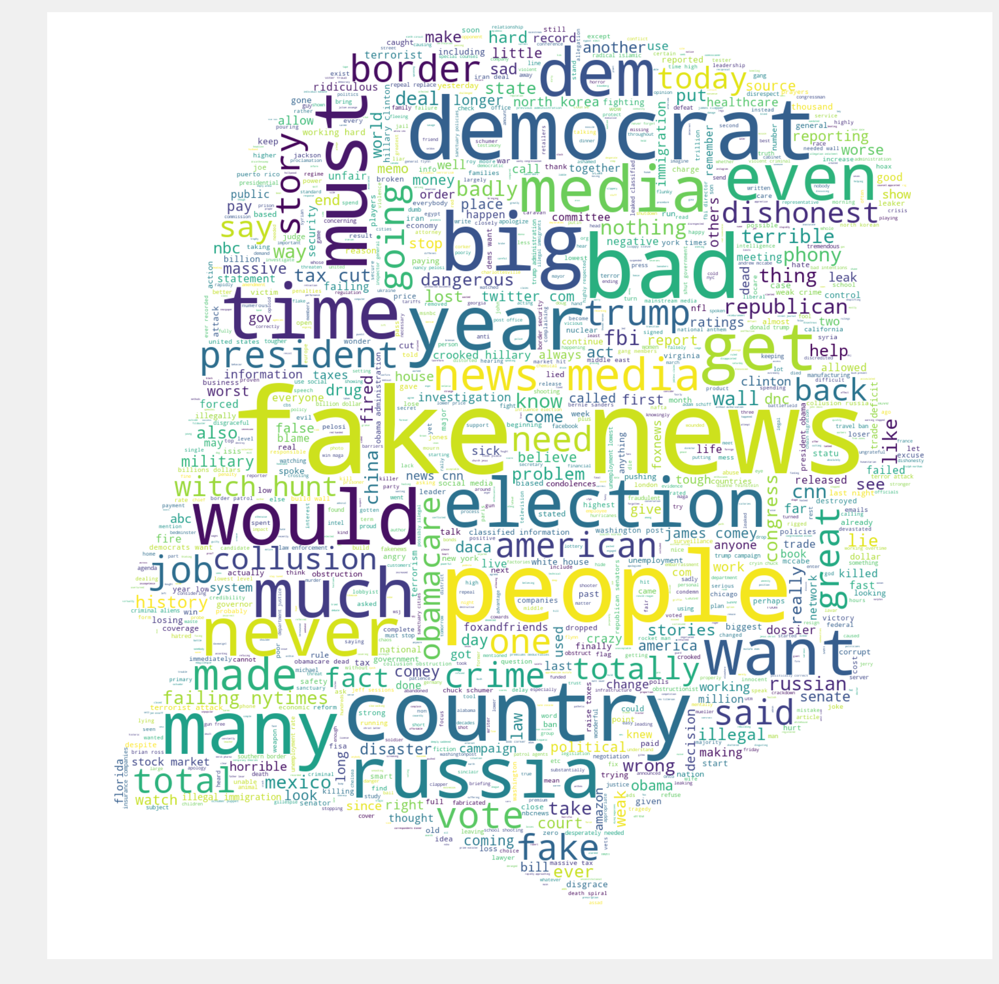

In [19]:
%%time
# negative sentiment
neg = " ".join(tw.loc[tw.score < -.4 , 'clean_text'])

masked = np.array(Image.open(IMG_PATH+"TTT_r.png"))

wc = WordCloud(background_color="white", max_words=2000, mask=masked,
               stopwords=stop_words, )

# generate word cloud
wc.generate(neg)

# store to file
wc.to_file(IMG_PATH+"trump_tweets_wordcloud_neg.png")

# show
plt.figure(figsize=(16,16))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")

## Take a look of Trump's Mood

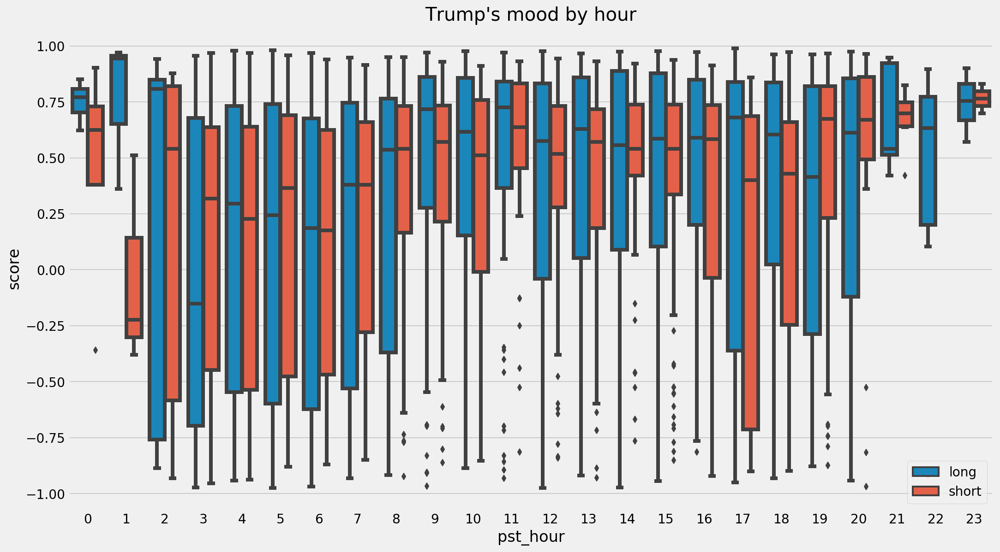

In [20]:
plt.figure(figsize=(16,9))
tmp=tw[tw.score!=0]
sns.boxplot(x='pst_hour', y='score', hue='tweet_length', data=tmp);
plt.legend(loc='lower right');
plt.title("Trump's mood by hour");

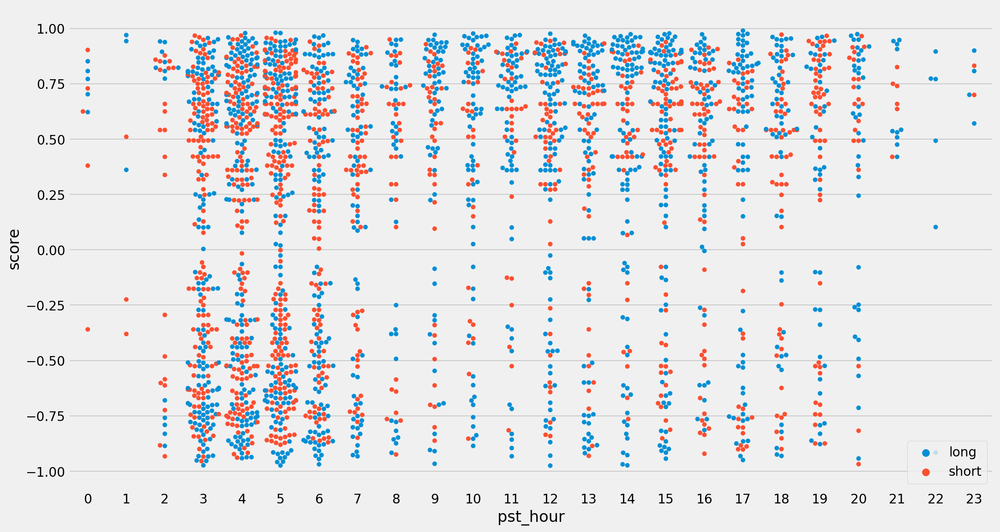

In [21]:
plt.figure(figsize=(16,9))
sns.swarmplot(x='pst_hour', y='score', hue='tweet_length', data=tmp);
plt.legend(loc='lower right');

In [22]:
# vader sentiment doesn't do a perfect job
[t for t in tw.loc[tw.score==0, 'text']]

# e.g.
# 'DOW,<br>S&P 500 and NASDAQ close at record highs!<br>#MAGA pic.twitter.com/hvqwnqSGuG' 
# 'DOW,<br>S&P 500 and NASDAQ close at record highs!<br>#MAGA pic.twitter.com/hvqwnqSGuG',

# should definitely be positive

['...haven’t even started yet!<br>The U.S.<br>has very little to give,<br>because it has given so much over the years.<br>China has much to give!',
 '#PeaceOfficersMemorialDay pic.twitter.com/agxulpPyag',
 'Trade negotiations are continuing with China.<br>They have been making hundreds of billions of dollars a year from the U.S.,<br>for many years.<br>Stay tuned!',
 'ZTE,<br>the large Chinese phone company,<br>buys a big percentage of individual parts from U.S.<br>companies.<br>This is also reflective of the larger trade deal we are negotiating with China and my personal relationship with President Xi.',
 '#USEmbassyJerusalem http:// pscp.tv/w/1kvJpWoqeLdGE',
 'Iran’s Military Budget is up more than 40% since the Obama negotiated Nuclear Deal was reached...just another indicator that it was all a big lie.<br>But not anymore!',
 'Five Most Wanted leaders of ISIS just captured!',
 'Gina Haspel did a spectacular job today.<br>There is nobody even close to run the CIA!',
 'Statement on the

## Daily S&P index

### Visualize from candlestick for S&P since Trump's administration

In [21]:
# inspired https://plot.ly/~jackp/17421/plotly-candlestick-chart-in-python/#/

def my_candlestick(df, num_of_std=2, online=False):
    data = [ dict(
        type = 'candlestick',
        open = df.Open,
        high = df.High,
        low = df.Low,
        close = df.Close,
        x = df.index,
        yaxis = 'y2',
        name = stock,
        increasing = dict( line = dict( color = '#17BECF' ) ),
        decreasing = dict( line = dict( color = '#7F7F7F' ) ),
    ) ]

    layout=dict()

    fig = dict( data=data, layout=layout )

    fig['layout'] = dict()
    fig['layout']['plot_bgcolor'] = 'rgb(250, 250, 250)'
    fig['layout']['xaxis'] = dict( rangeselector = dict( visible = True ) )
    fig['layout']['yaxis'] = dict( domain = [0, 0.2], showticklabels = False, autorange=True )
    fig['layout']['yaxis2'] = dict( domain = [0.2, 0.8])
    fig['layout']['legend'] = dict( orientation = 'h', y=0.9, x=0.3, yanchor='bottom' )
    fig['layout']['margin'] = dict( t=40, b=40, r=40, l=40 )


    rangeselector=dict(
        visibe = True,
        x = 0, y = 0.9,
        bgcolor = 'rgba(150, 200, 250, 0.4)',
        font = dict( size = 13 ),
        buttons=list([
            dict(count=1,
                 label='reset',
                 step='all'),
            dict(count=1,
                 label='1yr',
                 step='year',
                 stepmode='backward'),
            dict(count=3,
                label='3 mo',
                step='month',
                stepmode='backward'),
            dict(count=1,
                label='1 mo',
                step='month',
                stepmode='backward'),
            dict(step='all')
        ]))

    fig['layout']['xaxis']['rangeselector'] = rangeselector


    mv_y = movingaverage(df.Close)
    mv_x = list(df.index)

    # Clip the ends
    mv_x = mv_x[5:-5]
    mv_y = mv_y[5:-5]

    fig['data'].append( dict( x=mv_x, y=mv_y, type='scatter', mode='lines', 
                             line = dict( width = 1 ),
                             marker = dict( color = '#E377C2' ),
                             yaxis = 'y2', name='Moving Average' ) )

    colors = []

    for i in range(len(df.Close)):
        if i != 0:
            if df.Close[i] > df.Close[i-1]:
                colors.append('#17BECF')
            else:
                colors.append('#7F7F7F')
        else:
            colors.append('#7F7F7F')


    fig['data'].append( dict( x=df.index, y=df.Volume,                         
                             marker=dict( color=colors ),
                             type='bar', yaxis='y', name='Volume' ) )


    bb_avg, bb_upper, bb_lower = bbands(df.Close, num_of_std=num_of_std)

    fig['data'].append( dict( x=df.index, y=bb_upper, type='scatter', yaxis='y2', 
                             line = dict( width = 1 ),
                             marker=dict(color='#ccc'), hoverinfo='none', 
                             legendgroup='Bollinger Bands', name='Bollinger Bands') )

    fig['data'].append( dict( x=df.index, y=bb_lower, type='scatter', yaxis='y2',
                             line = dict( width = 1 ),
                             marker=dict(color='#ccc'), hoverinfo='none',
                             legendgroup='Bollinger Bands', showlegend=False ) )
    
    
    if online:
        html = py.plot( fig, filename = 'candlestick-stock', validate = False, auto_open=False,)
        print(html)

    # offline
    else:
        print('offline')
        iplot( fig, filename = 'candlestick-stock', validate = False )

def movingaverage(interval, window_size=5):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(interval, window, 'same')


def bbands(price, window_size=10, num_of_std=2):
    rolling_mean = price.rolling(window=window_size).mean()
    rolling_std  = price.rolling(window=window_size).std()
    upper_band = rolling_mean + (rolling_std*num_of_std)
    lower_band = rolling_mean - (rolling_std*num_of_std)
    return rolling_mean, upper_band, lower_band

In [22]:
stock = 'SPX'
# stock = 'DIA'
df = web.DataReader(stock, 'morningstar', start, end).reset_index().set_index('Date')
my_candlestick(df, online=False)

offline


In [25]:
tw[tw.text.str.contains('RECORD')]

,text,date,favorites,retweets,hashtags,mentions,permalink,id,score,pst_hour,length,clean_text,tweet_length
643,Somebody please inform Jay-Z that because of m...,2018-01-28 05:18:32,236175,61932,NaN,NaN,https://twitter.com/realDonaldTrump/status/957...,957603800579297280,-0.6399,5,139,somebody please inform jay policies black unem...,short
934,"Things are going really well for our economy,<...",2017-12-10 05:30:44,124183,27580,NaN,NaN,https://twitter.com/realDonaldTrump/status/939...,939849867438034944,-0.4763,5,275,things going really well economy subject fake ...,long
1025,"Dow,<br>S&P 500 and Nasdaq all finished the da...",2017-11-28 14:30:12,46604,10087,NaN,NaN,https://twitter.com/realDonaldTrump/status/935...,935636972252618753,0.0000,14,92,dow nasdaq finished day new record highs,short
1059,"HAPPY THANKSGIVING,<br>your Country is startin...",2017-11-23 03:28:32,201975,42176,NaN,NaN,https://twitter.com/realDonaldTrump/status/933...,933658521828315136,0.9564,3,280,happy thanksgiving country starting really wel...,long
1504,RECORD HIGH FOR S & P 500!,2017-09-29 06:39:53,57794,10810,NaN,NaN,https://twitter.com/realDonaldTrump/status/913...,913760243770896389,0.0000,6,26,record high,short
1636,ESPN is paying a really big price for its poli...,2017-09-15 04:20:08,107363,26438,NaN,NaN,https://twitter.com/realDonaldTrump/status/908...,908651641943003136,-0.6900,4,137,espn paying really big price politics bad prog...,short


In [24]:
stock = 'SPX'
# # SPDR Dow Jones Industrial Average ETF
df = web.DataReader(stock, 'morningstar', start, end).reset_index()
df['Date'] = df['Date'].apply(lambda x: x.date())
df['return'] = (df.Open - df.Open.shift(1))/df.Open

In [25]:
tw['Date'] = tw['date'].apply(lambda x: x.date())
TMP = tw.groupby('Date').score.mean().reset_index()
TMP.head()

,Date,score
0,2017-01-02,0.009686
1,2017-01-03,0.039200
2,2017-01-04,-0.185478
3,2017-01-05,-0.049133
4,2017-01-06,0.435300


In [26]:
return_sentiment = pd.merge(df, TMP)
return_sentiment = return_sentiment.loc[1:]
return_sentiment.head()

,Symbol,Date,Close,High,Low,Open,Volume,return,score
1,SPX,2017-01-03,2257.8280,2263.88,2245.13,2251.57,1007832258,-0.000018,0.039200
2,SPX,2017-01-04,2270.7525,2272.82,2261.60,2261.60,815322680,0.004435,-0.185478
3,SPX,2017-01-05,2268.9985,2271.50,2260.45,2268.18,908475195,0.002901,-0.049133
4,SPX,2017-01-06,2276.9814,2282.10,2264.06,2271.14,719174995,0.001303,0.435300
5,SPX,2017-01-09,2268.9042,2275.49,2269.01,2273.59,574411549,0.001078,0.052000


In [27]:
# no correlation btw daily sentiment score and return
np.corrcoef(return_sentiment['return'], return_sentiment['score'])

array([[ 1.        , -0.06709499],
       [-0.06709499,  1.        ]])

### Visualize S&P and President Trump's Tweets at the same time!

In [28]:
%%time

tmp = df.loc[:, 'Close']

# Calculate the 5 and 20 days moving averages of the closing prices
short_MA = tmp.rolling(window=5).mean()
long_MA = tmp.rolling(window=30).mean()


# # SPDR S&P 500 ETF Trust
# SPY = web.DataReader('SPY', 'morningstar', start, end)

colors = []

for i in range(len(df.Close)):
    if i != 0:
        if df.Close[i] > df.Close[i-1]:
            colors.append('green')
        else:
            colors.append('red')
    else:
        colors.append('red')
            
            
trace_high = go.Scatter(
                x=df.Date,
                y=df['High'],
                name = "High",
                line = dict(color = '#17BECF'),
                opacity = 0.8)

trace_low = go.Scatter(
                x=df.Date,
                y=df['Low'],
                name = "Low",
                line = dict(color = '#7F7F7F'),
                opacity = 0.8)

# dots
# trace_close = go.Scatter(
#                 x=df.Date,
#                 y=df['Close'],
#                 name = "Close",
#                 mode='markers',
#                 marker=dict(
#                 size='6',
#                 color = colors,
#                 showscale=False),)

# lines
trace_close_ = go.Scatter(
                x=df.Date,
                y=df['Close'],
                name = "Close",
                line = dict(color = 'black'),
                opacity = 0.8,)


# trace_MA5 = go.Scatter(
#                 x=df.Date,
#                 y=short_MA,
#                 name = "MA(5)",
#                 line = dict(color = 'green'),
#                 opacity = 0.3)

# trace_MA20 = go.Scatter(
#                 x=df.Date,
#                 y=long_MA,
#                 name = "MA(25)",
#                 line = dict(color = 'blue'),
#                 opacity = 0.3)

d = [[0, 'rgb(255,0,0)'], 
     [0.1, 'rgb(255,51,0)'], 
     [0.2, 'rgb(255,102,0)'], 
     [0.3, 'rgb(255,153,0)'], 
     [0.4, 'rgb(255,204,0)'], 
     [0.5, 'rgb(255,255,0)'], 
     [0.6, 'rgb(204,230,0)'], 
     [0.7, 'rgb(153,205,0)'], 
     [0.8, 'rgb(102,179,0)'], 
     [0.9, 'rgb(51,154,0)'], 
     [1.0, 'rgb(0,128,0)']]

tweets = go.Scatter(
                x=tw.date,
                y=tw['score'],
                name="Trump Tweets",
                text=tw['text'],
                hoverinfo='text',
                mode='markers',
                marker=dict(
                    color=tw['score'],
                    size='3',
                    showscale=False,
                    colorscale=d,
                ),
                yaxis='y2',
                opacity = 0.7)

data = [trace_high,trace_low,trace_close_, tweets]#trace_close,,trace_MA5,trace_MA20]

layout = go.Layout(
    title='%s Daily Average' %stock,
    hovermode='closest',
    xaxis=dict(
                rangeselector=dict(
                x = 0, y = 0.9,
                bgcolor = 'rgba(150, 200, 250, 0.4)',
                font = dict( size = 13 ),
                buttons=list([
                    dict(count=1,
                         label='reset',
                         step='all'),
                    dict(count=1,
                         label='1yr',
                         step='year',
                         stepmode='backward'),
                    dict(count=3,
                        label='3 mo',
                        step='month',
                        stepmode='backward'),
                    dict(count=1,
                        label='1 mo',
                        step='month',
                        stepmode='backward'),
                    dict(step='all')])),
        rangeslider=dict(),
        type='date'
    ),
    yaxis=dict(
        title='%s price' % stock
    ),
    yaxis2=dict(
        title='Sentiment',
        overlaying='y',
        side='right')
)

fig = dict(data=data, layout=layout)
# py.plot(fig, filename = "S&P_&_Trump_Tweets")
iplot(fig, filename = "S&P_&_Trump_Tweets")

CPU times: user 189 ms, sys: 7.05 ms, total: 196 ms
Wall time: 195 ms


In [29]:
[i for i in tw.loc[tw.clean_text.str.contains('billions'), 'text'].head(10)]

['The Washington Post and CNN have typically written false stories about our trade negotiations with China.<br>Nothing has happened with ZTE except as it pertains to the larger trade deal.<br>Our country has been losing hundreds of billions of dollars a year with China...',
 'Trade negotiations are continuing with China.<br>They have been making hundreds of billions of dollars a year from the U.S.,<br>for many years.<br>Stay tuned!',
 'So proud of our great Military which will soon be,<br>after the spending of billions of fully approved dollars,<br>the finest that our Country has ever had.<br>There won’t be anything,<br>or anyone,<br>even close!',
 'While Security spending was somewhat more than his predecessor,<br>Scott Pruitt has received death threats because of his bold actions at EPA.<br>Record clean Air & Water while saving USA Billions of Dollars.<br>Rent was about market rate,<br>travel expenses OK.<br>Scott is doing a great job!',
 'The United States hasn’t had a Trade Surplus

In [30]:
tw.loc[tw.clean_text.str.contains('north korea'), ['text', 'date', 'score']].head(10)

,text,date,score
30,North Korea has announced that they will disma...,2018-05-12 14:08:55,0.8641
42,The Failing New York Times criticized Secretar...,2018-05-09 15:38:10,-0.9434
44,I am pleased to inform you that Secretary of S...,2018-05-09 05:30:56,0.9081
52,"I will be speaking to my friend,<br>President ...",2018-05-08 04:22:53,0.8555
87,"As everybody is aware,<br>the past Administrat...",2018-05-02 17:53:30,-0.4753
88,“This isn’t some game.<br>You are screwing wit...,2018-05-02 15:40:23,-0.0772
94,There was no Collusion <br>(it is a Hoax) and ...,2018-05-02 04:45:08,-0.7897
100,Delegation heading to China to begin talks on ...,2018-05-01 04:00:00,0.7558
118,Just had a long and very good talk with Presid...,2018-04-28 06:45:20,0.6794
127,Please do not forget the great help that my go...,2018-04-27 04:50:02,0.9055


In [31]:
tw.loc[30, 'text']

'North Korea has announced that they will dismantle Nuclear Test Site this month,<br>ahead of the big Summit Meeting on June 12th.<br>Thank you,<br>a very smart and gracious gesture!'

In [40]:
tw.loc[tw.clean_text.str.contains('trade war'), ['text', 'date', 'score']]

,text,date,score
289,"We are not in a trade war with China,<br>that ...",2018-04-04 04:22:03,0.1739
466,When a country <br>(USA) is losing many billio...,2018-03-02 02:50:34,0.9381
